MIS 382N: ADVANCED MACHINE LEARNING

Assignment 4

Total points: 75 + 5 bonus points

Due: Monday, November 2 to be submitted via Canvas by 11:59 pm

Your homework should be written in a python notebook. If you prefer, you can work in groups of two. **Please note that only one student per team needs to submit the assignment on Canvas but make sure to include both students' names and UT EIDs.**

For any question that requires a handwritten solution, you may upload scanned images of your solution in the notebook or attach them to the assignment . You may write your solution using markdown as well.

Please make sure your code runs and the graphs and figures are displayed in your notebook before submitting. (%matplotlib inline)

**Additionally, upload any images you plan to incorporate in your notebook as attachments so we can see them in case the uploaded images don't appear properly on our end.**

**This can be an individual assignment or group of 2. If you choose to do it as a group, please specify who you are working with (name and EID), then only one student should submit the homework. Put your name and eid here.**

Name: Mihir Deshpande

EID: md46487

Name: Samarth Mishra 

EID: sm79247

# Question 1: Expected Loss Minimization [10 pts]
Consider a binary classification problem with the following loss matrix -
$$
   {\begin{array}{ccccc}
   & & \text{Predicted class} & \text{           } &\\
   & & C1 & C2 & Reject\\
   \text{True class} & C1 & 0 & r & c  \\
   & C2 & s & 0 & c \\
  \end{array} } 
$$

where the cost of rejection is a constant, and the costs $r$ and $s$ are positive real numbers. Let $f(x)=P(C1|x)$.


**(a) [2.5 points]** Show that the expected loss when $x$ is labelled as $C_1$ is a decreasing function of $f(x)$ while expected loss when $x$ is labelled as $C_2$ is a increasing function of $f(x)$.  


**Ans)** We need to calculate the expected loss in both cases.

When x is labelled as $C_1$ -

Expected cost $= 0*f(x) + s*(1-f(x))$ 

$= s-s*f(x)$

If we take the derivative wrt f(x),

$\delta Expected\_Cost = -s$

This is a decreasing function in f(x) = P(C1|x) assuming s >= 0.

When x is labelled as $C_2$ -

Expected cost $= r*f(x) + 0*(1-f(x))$

$= r*f(x)$

If we take the derivative wrt f(x),

$\delta Expected\_Cost = r$

This is an increasing function in f(x) = P(C1|x) assuming r >= 0.




**(b) [2.5 points]** For $c=0$, show that the decision which minimizes the expected loss is to reject all instances of $x$

**Ans)** 

We know that $0 <= f(X) <= 1$

Therefore, assuming the costs $s$ and $r$ are both positive and **f(x) /= 0**, we can conclude that -

$0 < r*f(X) <= r$ and

$0 < s-s*f(X) <= s$

Expected Loss of C1 = s-s\*f(X) > 0

Expected Loss of C2 = r\*f(X) > 0

Expected Loss of Reject = c = 0

Hence, the decision of rejection has an expected loss of 0 associated with it while other expected losses are greater than 0. The decision to reject will be chosen everytime.

**(c) [2.5 points]** Let $r=5$ and $s=2$, what is the minimum value of $c$ such that no instance of $x$ gets rejected (irrespective of  $f(x)$)?

**Ans)**

If $r=5$ and $s=2$,

Expected Loss of C1 = $s-s*f(X)$ = $2*(1-f(x))$   

Expected Loss of C2 = $r*f(X)$ = $5*f(x)$   

If Expected Loss of Reject is greater than the maximum possible loss that both these expected losses can take, we can assure the decision will never be to reject.

Let's calculate when the expected loss will be maximum for both -

c > Expected Loss of C1 

c > Expected Loss of C2

$c > 2 - 2*f(x)$ and

$c > 5*f(x) = \frac{2c}{5} > 2*f(x)$

Adding the two equations, 

$c + \frac{2c}{5} > 2$

$\therefore c  > \frac{10}{7}$ for reject option to never be exercised.


**(d) [2.5 points]** Let $r=7$, $s=4$, and $c=3$. Determine the  ranges of $f(x)$ for which the optimal decision is C1, reject and C2 respectively.

**Ans)**

If $r=7$ and $s=4$ and $c=3$,

Expected Loss of C1 = $r*f(X)$ = $7*f(x)$

Expected Loss of C2 = $s-s*f(X)$ = $4*(1-f(x))$

Expected Loss of Reject = c = 3

**A) Optimal Decision = C1**

$7*f(x) < 3$ (Expected Loss of C1 lesser than reject)

i.e $f(x) < 3/7$

$7*f(x) < 4-4*f(x)$ (Expected Loss of C1 lesser than C2)

i.e $f(x) < 4/11$

$\therefore 0 <= f(x) < 4/11$

**B) Optimal Decision = C2**

$4-4*f(x) < 3$ (Expected Loss of C2 lesser than reject)
i.e $f(x) > 1/4$

$4-4*f(x) < 7*f(x)$ (Expected Loss of C2 lesser than C1)
i.e $f(x) > 4/11$

$\therefore 4/11 < f(x) < 1$


**C) Optimal Decision = Reject**

$3 < 7*f(x)$ (Expected Loss of Reject lesser than C1)
i.e $f(x) > 3/7$

$3 < 4-4*f(x)$ (Expected Loss of Reject lesser than C1)
i.e $f(x) > 1/4$

But neither or these conditions are satisfied. Hence, the reject decision is never considered.


# Question 2: Logistic Regression [5 points]
Consider the problem of predicting the success of students in their undergraduate degrees given their high school GPA and SAT scores. We have the variables $X_1 =$ high school GPA, $X_2$ = SAT score and Y = completing the undergraduate degree (binary). We then fit a logistic regression which produces coefficients, $β_0 = −7$, $β_1 = 2$, $β_2 = 0.001$ Estimate the probability that George who
has a GPA of 3.4 and an SAT score of 1500 will complete his undergraduate degree successfully according to this model. By how much will the probability increase if the GPA increases to 3.7, with other factors remaining the same?

**Ans)**

Now, propensity = $\beta_0 + \beta_1X_1 + \beta_2X_2$

For $X_1$ = 3.4, $X_2$ = 1500, $β_0 = −7$, $β_1 = 2$, $β_2 = 0.001$

propensity = $p = -7 + 3.4*2 + 1500*0.001 = 1.3 = ln[\mu/(1-\mu)]$

Where $\mu$ = Probability

$\therefore \mu = \frac{exp(p)}{1+exp(p)} = \frac{e^{1.3}}{1+e^{1.3}} = 0.7858 = 78.57\%$

George has a **78.58%** chance of completing his degree succesfully.

If GPA = $X_1$ = 3.7

$p = -7 + 3.7*2 + 1500*0.001 = 1.9$

$\therefore \mu = \frac{exp(p)}{1+exp(p)} = \frac{e^{1.9}}{1+e^{1.9}} = 0.8698 = 86.98\%$

George's probability of completing his degree succesfully increases from **78.58%** to  **86.98%**.


# Question 2: Classification and Handling Class Imbalance [35 points + 5 bonus points]

In [ ]:
# Only use this code block if you are using Google Colab.
# If you are using Jupyter Notebook, please ignore this code block. You can directly upload the file to your Jupyter Notebook file systems.
#from google.colab import files

##

#It will prompt you to select a local file. Click on “Choose Files” then select and upload the file. 
## Wait for the file to be 100% uploaded. You should see the name of the file once Colab has uploaded it.
#uploaded = files.upload()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix

df = pd.read_csv('data/customer_churn_telcom.csv')

# Drop unnamed column
# df.columns
df.drop('Unnamed: 0',axis=1,inplace=True)

In [ ]:
# Printing the first five rows
df.head()

In [ ]:
for i in df:
    print(df[i].dtypes)

In [ ]:
def print_unique_col_values(df):
       for column in df:
            if df[column].dtypes=='object':
                print(f'{column}: {df[column].unique()}') 

print_unique_col_values(df)

## [5 points] Data Preprocessing 

(a) [1 pt] Some of the columns have values like - no internet service or no phone service. Replace these two values with with a simple No

In [ ]:
# Replace values with No
df.replace(to_replace=['No internet service','No phone service'], value='No', inplace=True)
print_unique_col_values(df)

(b) [1 pt] Convert all 'Yes' values to 1 and 'No' values to 0 <br>
(c) [1 pt] Convert all  'Female' values to 1 and 'Male' values to 0

In [ ]:
# Changing values to 0/1

yes_no_columns = ['Partner','Dependents','PhoneService','MultipleLines','OnlineSecurity','OnlineBackup',
                  'DeviceProtection','TechSupport','StreamingTV','StreamingMovies','PaperlessBilling','Churn']

for i in yes_no_columns:
    df[i] = df[i].replace(to_replace='Yes',value=1)
    df[i] = df[i].replace(to_replace='No',value=0)
    
# Female to 1, Male to 0

df['gender'] = df['gender'].replace(to_replace='Female',value=1)
df['gender'] = df['gender'].replace(to_replace='Male',value=0)


(d) [2 pts] Perform one-hot encoding on the folowing columns: 'InternetService', 'Contract', 'PaymentMethod'

In [ ]:
# One hot encoding for categorical columns
# Name your final dataframe df 2

# Your code here
col_to_encode = ['InternetService', 'Contract', 'PaymentMethod']
df2 = pd.get_dummies(df, columns=col_to_encode)
df2

In [ ]:
# Scaling
cols_to_scale = ['tenure','MonthlyCharges','TotalCharges']

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df2[cols_to_scale] = scaler.fit_transform(df2[cols_to_scale])

e) [1 pt] Split the dataset into training and test using a 80-20 split with a random state of 15. Perform stratified sampling on the target variable while doing so. Split the training data further into training (80%) and validation sets (20%) with a random state of 15. Perform stratified sampling on the target variable while doing so.

Note: The 'stratify' parameter can be used for this in the train_test_split function. 

In [ ]:
# Train test split
from sklearn.model_selection import train_test_split

X = df2.drop('Churn', axis=1)

y = df2['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=15, stratify=y)

# Split into train and validation

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=15, stratify=y_train)


In [ ]:
# With samples corresponding to the positive class being very low, we can clearly see the imbalance in our data 
print('Churn occurences in the training set \n', y_train.value_counts())
print('\n')
print('Churn occurences throughout the data \n', y.value_counts())

## [15 points] Decision Trees, Logistic Regression, and MLP

Use the example provided [here](https://scikit-learn.org/stable/modules/tree.html) to get an idea of how to use sklearn's decision tree classifier.

Go through the documentation [here](https://scikit-learn.org/0.16/modules/generated/sklearn.linear_model.LogisticRegression.html) to understand how to use sklearn's logistic regression model.

Go through the documentation [here](https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html) to understand how to use sklearn's MLP Model.

(a) [5 pts (+5 bonus points)] Train the three classifiers on the dataset and print confusion matrix on both - the validation data as well as the test data for all the three models (you can either use default parameters for MLP classifier or change them to obtain higher performance for additional bonus of 5 points). <br>
(b) [5 pts] Plot the ROC Curves for all the three classifiers in a single graph and display the AUC-ROC scores for all the classifiers in this plot as well. Use both the validation and the test data to plot these curves as well as to calculate the AUC-ROC scores. Use one graph for validation data and one graph for test data (all models for validation data in one graph and all models for test data in one graph - and use this scheme for plotting in all subsequent plotting questions). <br>
(c) [5 pts] Plot the Precision-Recall curves for all the three classifiers in a single graph. Use both the validation and the test data to plot these curves. Use one graph for validation data and one graph for test data.

Helpful resources can be found here - 
1. [sklearn.tree.DecisionTreeClassifier.score](https://github.com/scikit-learn/scikit-learn/blob/37ac6788c/sklearn/base.py#L625)
2.  [sklearn.linear_model.LogisticRegression.score](https://github.com/scikit-learn/scikit-learn/blob/37ac6788c/sklearn/base.py#L625)
3. [sklearn.neutral_network.MLPClassifier.score](https://github.com/scikit-learn/scikit-learn/blob/36958fb24/sklearn/base.py#L640)
4. [sklearn.metrics.plot_roc_curve](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_roc_curve.html)
5. [sklearn.metrics_confusion_matrix](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html)

Note: In this question, we are using the default parameters for MLP classifier, but you can change these parameters to obtain higher accuracies. **For a bonus of 5 points, experiment with these parameters to obtain a higher performance (in terms of accuracy and AUC-ROC scores).**

In [ ]:
# Decision Tree Classifier
from sklearn import tree
from sklearn.metrics import confusion_matrix

# Answer here

clf_tree = tree.DecisionTreeClassifier()
clf_tree = clf_tree.fit(X_train, y_train)

# For Validation Set -
y_pred = clf_tree.predict(X_val)
print(confusion_matrix(y_val, y_pred))

#For Test set -
y_pred = clf_tree.predict(X_test)
print(confusion_matrix(y_test, y_pred))


In [ ]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
# Answer here
clf_log = LogisticRegression()
clf_log = clf_log.fit(X_train, y_train)

# For Validation Set -
y_pred = clf_log.predict(X_val)
print(confusion_matrix(y_val, y_pred))

#For Test set -
y_pred = clf_log.predict(X_test)
print(confusion_matrix(y_test, y_pred))


In [ ]:
# MLP Classifier
from sklearn.neural_network import MLPClassifier
# Answer here
clf_neural = MLPClassifier()
clf_neural = clf_neural.fit(X_train, y_train)

# For Validation Set -
y_pred = clf_neural.predict(X_val)
print(confusion_matrix(y_val, y_pred))

#For Test set -
y_pred = clf_neural.predict(X_test)
print(confusion_matrix(y_test, y_pred))


In [ ]:
# Now let's try to find better parameters using GridSearchCV

# Note: Here is default score returned by MLP (and hence used as basis by GridSearch CV is mean accuracy)
from sklearn.model_selection import GridSearchCV

nn = MLPClassifier()

parameter_grid = {'hidden_layer_sizes':[(30,30,30),(100,),(200,),(500,)], 
                 'activation':['tanh','relu'],
                 'learning_rate_init':[0.0001,0.01],
                 'alpha':[0.0001,0.001,0.01]}

clf_neural_cv = GridSearchCV(nn, parameter_grid)
clf_neural_cv = clf_neural_cv.fit(X_train, y_train)


In [ ]:
# What are the best params?
clf_neural_cv.cv_results_['params'][clf_neural_cv.best_index_]

In [ ]:
best_params = clf_neural_cv.cv_results_['params'][clf_neural_cv.best_index_]
#best_params = {'activation': 'tanh',
 #'alpha': 0.0001,
 #'hidden_layer_sizes': (30, 30, 30),
 #'learning_rate_init': 0.0001,
 #'solver': 'adam'}

In [ ]:
# Lets look at the confusion matrices with these parameters -

clf_neural_best = MLPClassifier(activation=best_params['activation'],
                               hidden_layer_sizes=best_params['hidden_layer_sizes'],
                               alpha=best_params['alpha'],
                               learning_rate_init=best_params['learning_rate_init'])

clf_neural_best = clf_neural_best.fit(X_train, y_train)

# For Validation Set -
y_pred = clf_neural_best.predict(X_val)
print(confusion_matrix(y_val, y_pred))

#For Test set -
y_pred = clf_neural_best.predict(X_test)
print(confusion_matrix(y_test, y_pred))

In [ ]:
# Plot ROC curves
from sklearn.metrics import RocCurveDisplay
fig = RocCurveDisplay.from_estimator(clf_tree, X_test, y_test)
fig = RocCurveDisplay.from_estimator(clf_log, X_test, y_test, ax=fig.ax_)
fig = RocCurveDisplay.from_estimator(clf_neural_best, X_test, y_test, ax=fig.ax_)
fig.figure_.suptitle("ROC curve comparison Test Data")
fig.set_size_inches=((12,7.5))
plt.show()

In [ ]:
fig = RocCurveDisplay.from_estimator(clf_tree, X_val, y_val)
fig = RocCurveDisplay.from_estimator(clf_log, X_val, y_val, ax=fig.ax_)
fig = RocCurveDisplay.from_estimator(clf_neural_best, X_val, y_val, ax=fig.ax_)
fig.figure_.suptitle("ROC curve comparison Validation Data")
fig.set_size_inches=((12,7.5))
plt.show()

In [ ]:
# Plot PR curves
from sklearn.metrics import PrecisionRecallDisplay
fig = PrecisionRecallDisplay.from_estimator(clf_tree, X_test, y_test)
fig = PrecisionRecallDisplay.from_estimator(clf_log, X_test, y_test, ax=fig.ax_)
fig = PrecisionRecallDisplay.from_estimator(clf_neural_best, X_test, y_test, ax=fig.ax_)
fig.figure_.suptitle("Precision Recall curve comparison Test Data")
fig.set_size_inches=((12,7.5))
plt.show()

In [ ]:
from sklearn.metrics import f1_score

# For Test Set -
y_pred_test_nn = clf_neural_best.predict(X_test)
y_pred_test_tree = clf_tree.predict(X_test)
y_pred_test_log = clf_log.predict(X_test)

f1_test_tree = f1_score(y_test, y_pred_test_tree)
f1_test_log = f1_score(y_test, y_pred_test_log)
f1_test_nn = f1_score(y_test, y_pred_test_nn)

print("F1 score on Test set for Tree = ", f1_test_tree)
print("F1 score on Test set for Logistic Regression = ", f1_test_log)
print("F1 score on Test set for MLP = ", f1_test_nn)

In [ ]:
fig = PrecisionRecallDisplay.from_estimator(clf_tree, X_val, y_val)
fig = PrecisionRecallDisplay.from_estimator(clf_log, X_val, y_val, ax=fig.ax_)
fig = PrecisionRecallDisplay.from_estimator(clf_neural_best, X_val, y_val, ax=fig.ax_)
fig.figure_.suptitle("Precision Recall curve comparison Validation Data")
fig.set_size_inches=((12,7.5))
plt.show()

In [ ]:
# For Validation Set -
y_pred_val_nn = clf_neural_best.predict(X_val)
y_pred_val_tree = clf_tree.predict(X_val)
y_pred_val_log = clf_log.predict(X_val)

f1_val_tree = f1_score(y_val, y_pred_val_tree)
f1_val_log = f1_score(y_val, y_pred_val_log)
f1_val_nn = f1_score(y_val, y_pred_val_nn)

print("F1 score on Validation set for Tree = ", f1_val_tree)
print("F1 score on Validation set for Logistic Regression = ", f1_val_log)
print("F1 score on Validation set for MLP = ", f1_val_nn)

## [4 points] Handling Class Imbalance with SMOTE

Go through the documentation [here](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html) to understand how to use imbalanced-learn's SMOTE to counter class imbalance in the data.

(a) [1 pt] Split the data into training (80%) and test sets (20%) with a random state of 15. Perform stratified sampling on the target variable while doing so.

Note: The 'stratify' parameter can be used for this in the train_test_split function. 

In [ ]:
X = df2.drop('Churn',axis='columns')
y = df2['Churn']

# Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=15, stratify=y)


(b) [2 pts] Perform SMOTE on the training data and print the value counts of the target variable in the data.

In [ ]:
# To install imbalanced-learn library use pip install imbalanced-learn command

from imblearn.over_sampling import SMOTE
from collections import Counter
# Answer here

sm = SMOTE(random_state=15)
print('Original dataset shape %s' % Counter(y_train))

X_res, y_res = sm.fit_resample(X_train, y_train)

print('Resampled dataset shape %s' % Counter(y_res))

(c) [1 pt] Split the updated training data (on which SMOTE has been run) further into training (80%) and validation sets (20%) with a random state of 15. Perform stratified sampling on the target variable while doing so.

Note: The 'stratify' parameter can be used for this in the train_test_split function. 

In [ ]:
# Answer here
# Split into train and validation

X_train, X_val, y_train, y_val = train_test_split(X_res, y_res, train_size=0.8, test_size=0.2, random_state=15, stratify=y_res)

In [ ]:
# Number of classes in training Data
y_train.value_counts()

In [ ]:
# Number of classes in validation Data
y_val.value_counts()

## [2 points] Retraining the Classifiers

Now that we have created synthetic samples of the minority class, let's proceed further to see if we see any improvements in our results. For the two models - Logistic regressor and MLP, do the folowing:

(a) [1 pt] Train a model on the training dataset. <br>
(b) [1 pt] Make predictions on the test data using the trained model and print confusion matrix for both - the validation and the test data.

In [ ]:
# Logistic Regression

clf_log_res = LogisticRegression()
clf_log_res = clf_log_res.fit(X_train, y_train)

# For Validation Set -
y_pred_smote_val_log = clf_log_res.predict(X_val)
print(confusion_matrix(y_val, y_pred_smote_val_log))

#For Test set -
y_pred_smote_test_log = clf_log_res.predict(X_test)
print(confusion_matrix(y_test, y_pred_smote_test_log))

In [ ]:
# MLP

clf_neural_res = MLPClassifier(activation=best_params['activation'],
                               hidden_layer_sizes=best_params['hidden_layer_sizes'],
                               alpha=best_params['alpha'],
                               learning_rate_init=best_params['learning_rate_init'])
clf_neural_res = clf_neural_res.fit(X_train, y_train)

# For Validation Set -
y_pred_smote_val_mlp = clf_neural_res.predict(X_val)
print(confusion_matrix(y_val, y_pred_smote_val_mlp))

#For Test set -
y_pred_smote_test_mlp = clf_neural_res.predict(X_test)
print(confusion_matrix(y_test, y_pred_smote_test_mlp))

## [9 points] Plotting and Comparison
a) [1 pt] For the two classifiers (Logistic regression and MLP) - plot the ROC Curves in a single graph, display the AUC-ROC scores in this plot as well on both the validation and the test data. Use one graph for validation data and one graph for test data. <br>
b) [1 pt] Plot the Precision-Recall curves for the two classifiers in a single graph on both the validation and the test data. Use one graph for validation data and one graph for test data. <br>
c) [7 pts] Compare and contrast the performance of the classifiers with reference to these two plots and with reference to the plots that were computed before using SMOTE. Specifically comment on what you observed regarding the difference in performance on the validation vs. the test dataset, which is a better representative of the actual/original problem.

In [ ]:
# Plot ROC curves

fig = RocCurveDisplay.from_estimator(clf_log_res, X_test, y_test)
fig = RocCurveDisplay.from_estimator(clf_neural_res, X_test, y_test, ax=fig.ax_)
fig.figure_.suptitle("ROC curve comparison Test Data")
fig.set_size_inches=((12,7.5))
plt.show()

In [ ]:
fig = RocCurveDisplay.from_estimator(clf_log_res, X_val, y_val)
fig = RocCurveDisplay.from_estimator(clf_neural_res, X_val, y_val, ax=fig.ax_)
fig.figure_.suptitle("ROC curve comparison Validation Data")
fig.set_size_inches=((12,7.5))
plt.show()

In [ ]:
# Plot PR curves

fig = PrecisionRecallDisplay.from_estimator(clf_log_res, X_test, y_test)
fig = PrecisionRecallDisplay.from_estimator(clf_neural_res, X_test, y_test, ax=fig.ax_)
fig.figure_.suptitle("Precision Recall curve comparison Test Data")
fig.set_size_inches=((12,7.5))
plt.show()

In [ ]:
# For Test Set -


f1_test_smote_log = f1_score(y_test, y_pred_smote_test_log)
f1_test_smote_mlp = f1_score(y_test, y_pred_smote_test_mlp)


print("F1 score on Test set for Logistic Regression after SMOTE = ", f1_test_smote_log)
print("F1 score on Test set for MLP after SMOTE = ", f1_test_smote_mlp)

In [ ]:
fig = PrecisionRecallDisplay.from_estimator(clf_log_res, X_val, y_val)
fig = PrecisionRecallDisplay.from_estimator(clf_neural_res, X_val, y_val, ax=fig.ax_)
fig.figure_.suptitle("Precision Recall curve comparison Validation Data")
fig.set_size_inches=((12,7.5))
plt.show()

In [ ]:
# For Validation Set -


f1_val_smote_log = f1_score(y_val, y_pred_smote_val_log)
f1_val_smote_mlp = f1_score(y_val, y_pred_smote_val_mlp)


print("F1 score on Validation set for Logistic Regression after SMOTE = ", f1_val_smote_log)
print("F1 score on Validation set for MLP after SMOTE = ", f1_val_smote_mlp)

## Comparison:

Let's compare the areas under the curve for test and validation data with and without using SMOTE -

**Without SMOTE**

Validation ROC Curve AUC with Logistic Regression = 0.84

Validation ROC Curve AUC with MLP = 0.84

Test ROC Curve AUC with Logistic Regression = 0.83

Test ROC Curve AUC with MLP = 0.83

Validation PR Curve AUC with Logistic Regression = 0.66

Validation PR Curve AUC with MLP = 0.67

Test PR Curve AUC with Logistic Regression = 0.63

Test PR Curve AUC with MLP = 0.63

F1 score on Test set for Logistic Regression =  0.5982404692082111

F1 score on Test set for MLP =  0.6002928257686676

F1 score on Validation set for Logistic Regression =  0.5703839122486288

F1 score on Validation set for MLP =  0.5750452079566003

**With SMOTE**

Validation ROC Curve AUC with Logistic Regression = 0.88

Validation ROC Curve AUC with MLP = 0.87

Test ROC Curve AUC with Logistic Regression = 0.83

Test ROC Curve AUC with MLP = 0.83

Validation PR Curve AUC with Logistic Regression = 0.87

Validation PR Curve AUC with MLP = 0.85

Test PR Curve AUC with Logistic Regression = 0.65

Test PR Curve AUC with MLP = 0.63

F1 score on Test set for Logistic Regression after SMOTE =  0.6300448430493274

F1 score on Test set for MLP after SMOTE =  0.6157354618015963

F1 score on Validation set for Logistic Regression after SMOTE =  0.8036951501154734

F1 score on Validation set for MLP after SMOTE =  0.8011695906432748

\# Note SMOTE was not performed on test data in either case

We can see that the validation set area under the curve for both classifiers increases from ~0.83 to ~0.87 for the ROC curve as well as the Precision Recall curve after SMOTE was performed.

Also the F1 score for both the models on the validation set increased drastically from ~0.57 to ~0.81. That's a 42% increase!

In the first case, we did not perform SMOTE on training, validation or test data. This is why the performance on validation and test set was somewhat comparably similar.

However, in the second case, we trained our models on data on which SMOTE was performed and validated on SMOTE data as well. In this case, the performance was noticeably higher as the area under curve for ROC and Precision Recall curve increased by ~0.05 and F1 score increase by ~0.24 for both the models. This is because the no. of observations in each class were artificially balanced by SMOTE which led to a better fit. However, when run against the test set which was untouched by SMOTE (i.e was heavily class imbalanced), both models performed poorly compared to validation data and gave similar performance as the test data from the first case.


# Question 4: Bayesian Belief Networks [15 pts]



Refer to the Bayesian Network Belief image (uploaded with the notebook on canvas) for this question. 

All nodes are binary and can take 0/1 values

The probabilities are given below:

P(Season = 1) = .001   
P(Atmospheric Pressure = 1) = 0.002


P(Rain = 1 | Season = 0, Atmospheric Pressure = 0) = .001  
P(Rain = 1 | Season = 0, Atmospheric Pressure = 1) = .29  
P(Rain = 1 | Season = 1, Atmospheric Pressure = 0) = .94  
P(Rain = 1 | Season = 1, Atmospheric Pressure = 1) = .95

P(Umbrella = 1 | Rain = 1) = .9  
P(Umbrella = 1 | Rain = 0) = .05

For the given Bayesian network, Compute the following probabilities : 


**(a) [4 pts]** Find the probability that  Umbrella = 0 

**Ans)** 






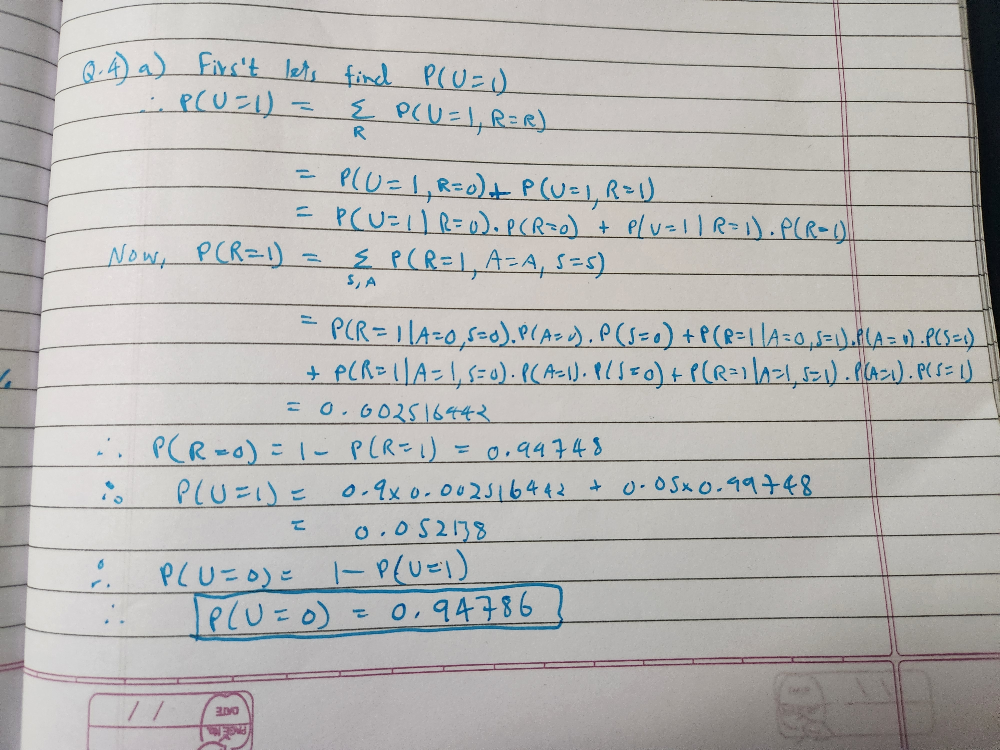

**(b) [4 pts]** Given that there is low Atmospheric Pressure (Atmospheric Pressure = 0), what is the probability that Rain = 1

**Ans)**







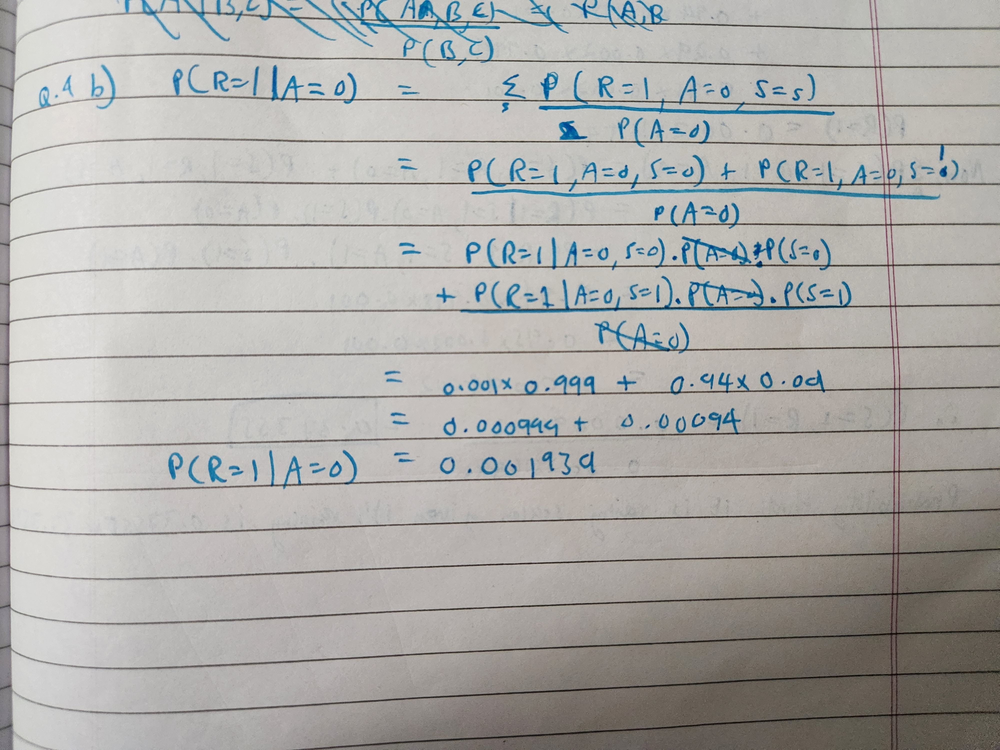

**(c) [7 pts]** Given that it rains(Rain = 1), what is the probability that the it is rainy season (Season = 1)

**Ans)**



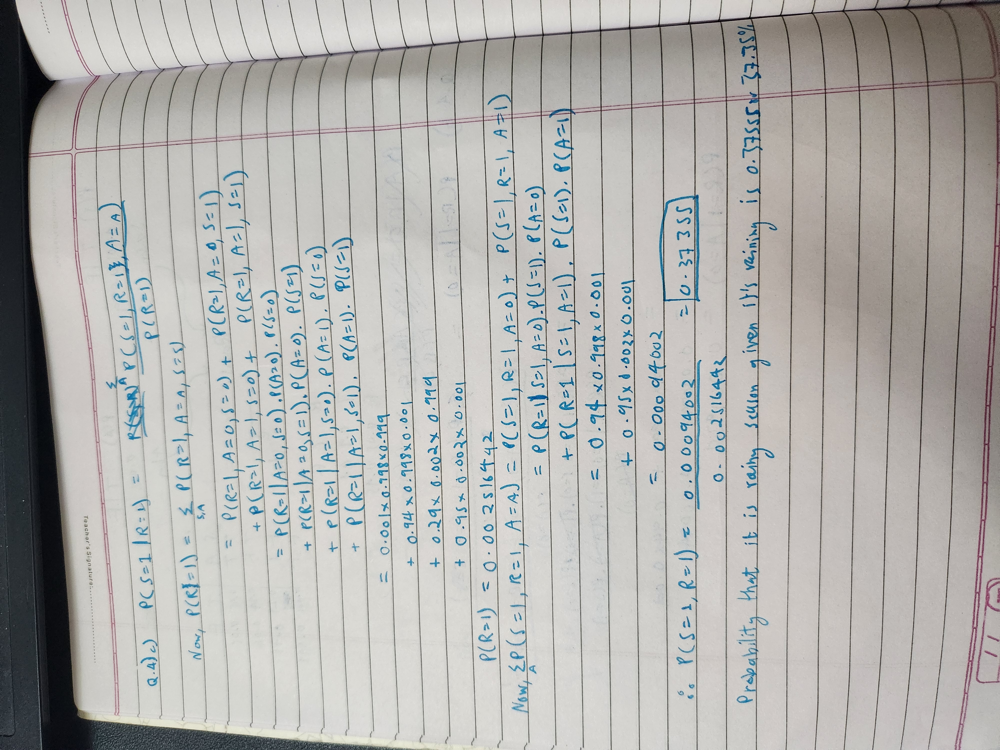

# Question 5: Support Vector Machines [10 pts]

1. [3 pts] Explain in what sense the Support Vector Machine seeks an optimal answer in the space of linear classifiers.
2. [3 pts] Describe how a slack variable works.
3. [4 pts] Explain how the SVM framework can be extended in order to provide non-linear decision boundaries.

## 1)

Let's assume the data is in 2 dimensional space, inherently belongs to two classes (blue and purple) and is linearly separable -

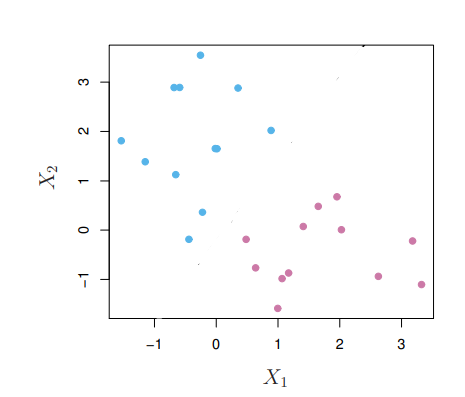

We could fit a line such that it perfectly separates this data into its two separate consituent classes.
If you think about it, there could be almost an infinite number of such lines that separate the classes -

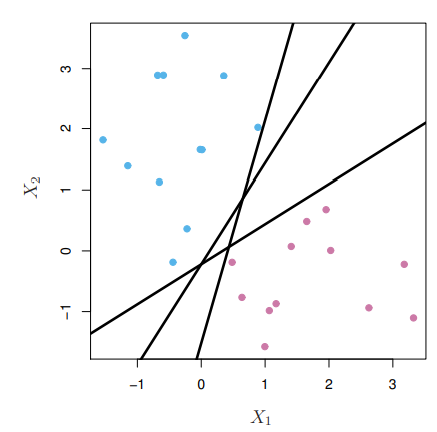

However, we need a way to pick one of these lines that adequately separate the data. To choose such a line, we need a metric whose value changes based on the line selected and then we can select the line which gives us the optimal value of that metric.

A Support Vector Classifier tries to maximize the Margin 'M' between the line and each data point in each class -

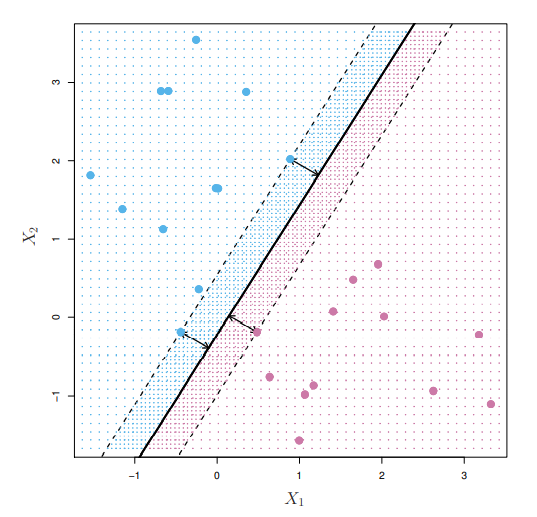

We can see that the value of M only depends on the data points that line along the margin on each side of the line and not on any other point. The vectors drawn from the points on the margin to the hyperplane are what define the hyperplane. These are called the support vectors and are where the term 'Support Vector Machine' comes from.

## How can we use this plane to classify points?

Mathematically, let's define the equation of this hyper-plane in p-dimensions as follows -

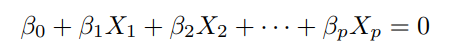

Now, if we subsititute points lying on the opposite side of the plane in the equation, the value of the equation will have opposite signs! This is how we can classify each point intuitively! If substituting the point in the equation gives a positive value, it belongs to the first class. If it yields a negative value, it belongs to the second class.

This is the principle on which Support Vector Machines work. 

If we define variable $y_i$ such that $y_i = 1$ when class is blue and $y_i = -1$ when class is purple, we can show for all i=1...n (no of points) -

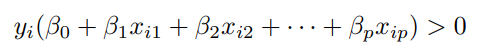

*But what if the the data is not linearly separable perfectly? Look in the next question*

# 2)

Continuing our discussion from the previous question, let us define an optimization probelm that helps us define the hyperplane mathematically as follows -

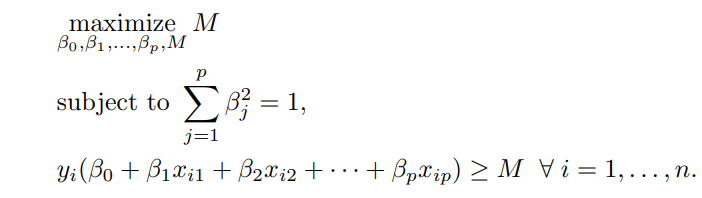

where M = total margin and $<\beta_i>$ are the co-efficients of the hyperplane equation.

Notice that the second constraint ensures that no points can lie between the line and the margins on either side of the line.

In the real world, it's possible that the data is not perfectly separable -

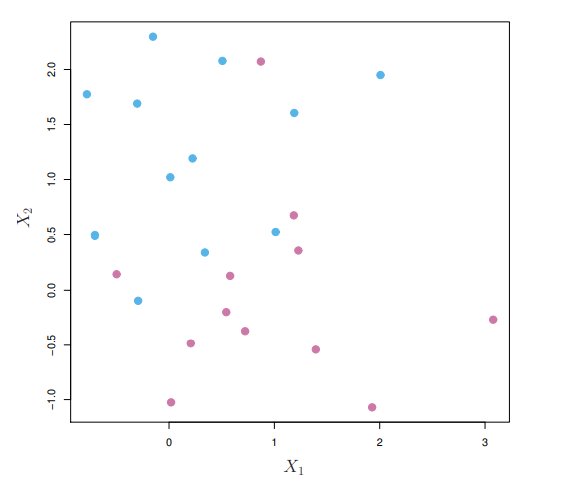

For the above data, there is no single line that can perfectly separate the two classes. In this case, there will be no solution to the optimization probelm defined above.

We need to redefine the problem such that it allows for some points to be within the margin and the line or even misclassified i.e we need to introduce some possibility or margin of error.

We can do this by introducing a slack variable $\epsilon_i$ in the constraints of the optimization problem -

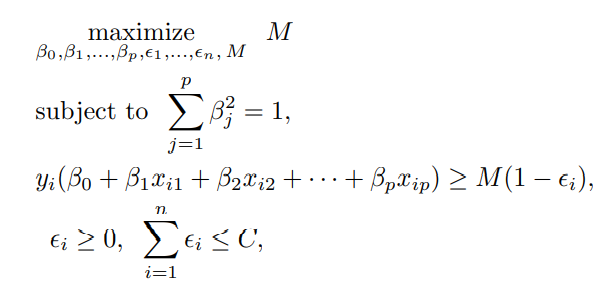

This slack variable $\epsilon_i$ relaxes the constraint that no points can lie between the line and the margins and introduces a margin of error or 'slack'. The optimiation problem defined above can produce a solution even when the data points are not perfectly separable. 

The constant 'C' acts a tuning parameter and controls the amount of slack that is allowed in the solution. Higher values of C means higher possible values of slack and hence, higher probability of misclassifications.

For eg, for the data points shown above, the hyperplane separator might look as follows for decreasing values of C (left to right, top to bottom)-

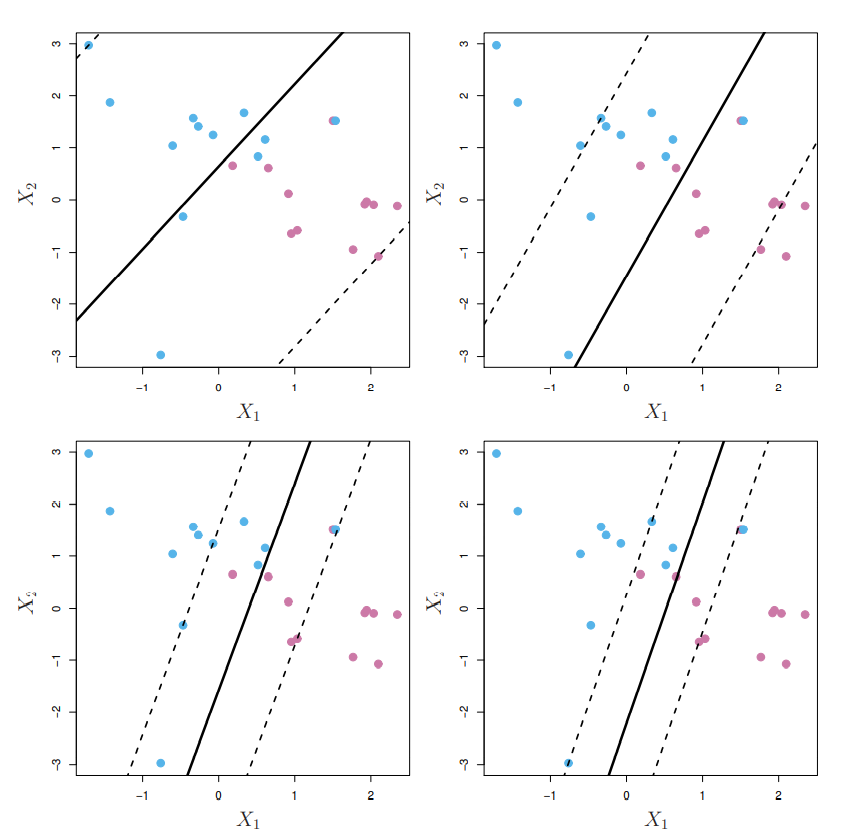

Hence, a slack variable helps us arrive at a reasonable solution for the classifying hyperplane when the data is not perfectly separable in linear space.

# 3)

Can we use the concept of Support Vector Classifiers to separate data that is not linearly separable whatsoever? For eg -

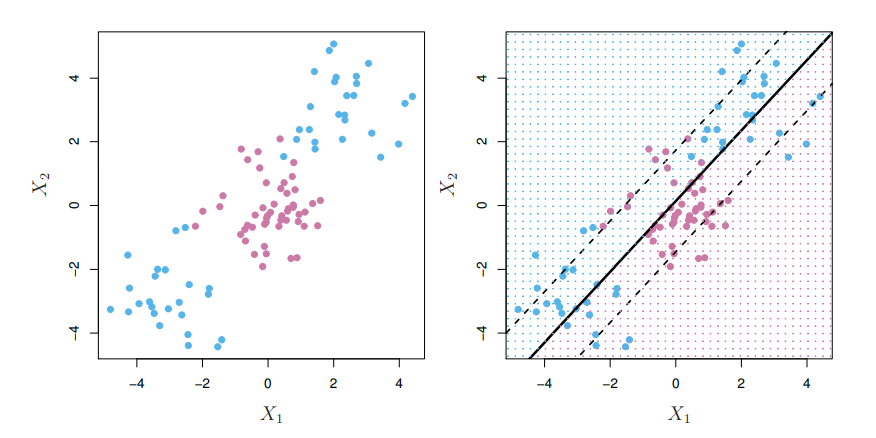

We can apply the same principle used in regression of expanding the subspace by adding non-linear dimensions but it can get too computationally intractable if we do not perform this in an ordered manner.

Without diving deep into the mathematics, we can represent the equation of the classifier hyperplane in another way as follows -

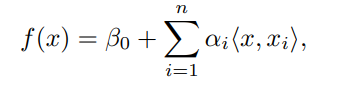

Where $<x,x_i>$ is the inner product between the two points in p-dimensional space.

This equation tells us that the equation of the hyperplane is defined by the ${n \choose 2}$ inner products of all data points. However, we can show that the value for $\alpha_i$ for all points that do not lie on or inside the margins is 0. This ties back to the fact that the hyperplane is only defined by the points on or inside the margin (i.e by the support vectors) and not any other points.

Hence, if all the points that lie or in the margins are defined by set $S$, we can rewrite the equation of the hyperplane as follows -

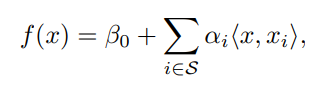

This drastically reduces the complexity of finding $f(x)$ because the solution space is now reduced to the points in $S$ which is considerably smaller than the entire set of data points.

Think about this - The inner product is essentially a measure of similarity between two points, generally speaking. But is it the only measure of similarity? Can we consider any other measures of similarity in our equation of the classifier?

Let us replace the inner product of similarity with a more generalized notation $K(x,x_i)$ called the $Kernel$ function.

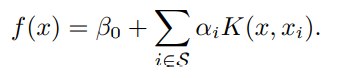

If we set the kernel to be a non-linear function in X1 and X2 (in above 2 dimensional example), we can effectively get a non-linear classifier without having to expand the entire space of data points with non-linear dimensions.

This is the USP of SUpport Vector Machines. In most other techniques, we need to expand the entire space by adding non-linear dimensions which can get computationally intensive. However, in SVM, we only need to transform the smaller subset of points around and inside the margin and calculate their similarities and we can effectively get a non-linear separator.

For eg, let's set the Kernel function to be a polynomial of degree 'd' -

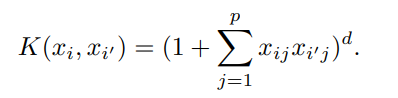

If d=1, it transforms into the previous Support Vector Classifier we looked at.

We can also tranform the data into a spherical space by using the radial kernel -


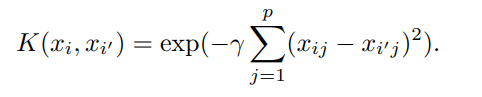

Let's see how we can use these non-linear kernels to separate the data in the previous figure -

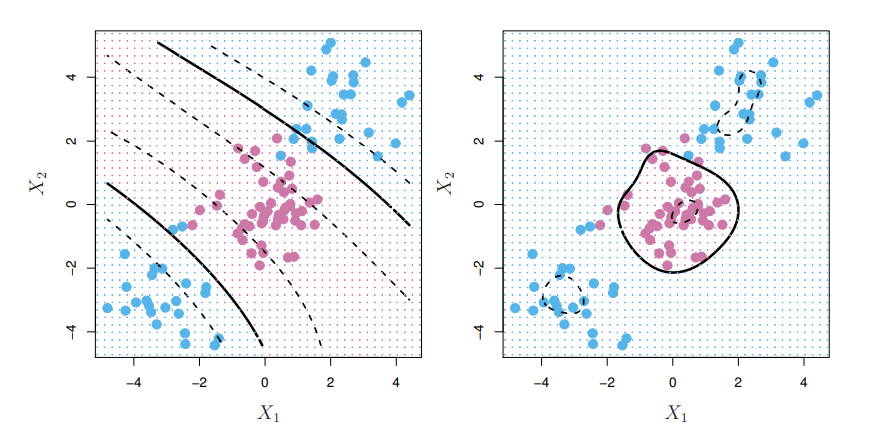

Left: Polynomial separator kernel with degree d =3

Right: Radial kernel

We can see how introducing the concept of a Kernel function in Support Vector Machines helps us in separating non-linear data.